In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import anndata as ad
import scanpy as sc

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from umap import UMAP


from scroutines import basicu
from scroutines import powerplots
from scroutines.miscu import is_in_polygon

import utils_merfish
from merfish_datasets import merfish_datasets
from merfish_genesets import get_all_genesets

import importlib
importlib.reload(powerplots)
importlib.reload(utils_merfish)

<module 'utils_merfish' from '/u/project/zipursky/f7xiesnm/v1-bb/v1/myvisctx/analysis_merfish/utils_merfish.py'>

In [2]:
np.random.seed(0)

In [3]:
def binning_pipe(adata, layer, bin_type, n=20):
    """
    """
    assert bin_type in ['depth_bin', 'width_bin']
    # bin it 
    depth_bins, depth_binned = utils_merfish.binning(adata.obs['depth'].values, n)
    width_bins, width_binned = utils_merfish.binning(adata.obs['width'].values, n)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['depth_bin'] = depth_binned
    norm_['width_bin'] = width_binned
    
    norm_mean = norm_.groupby(bin_type).mean(numeric_only=True)
    norm_sem  = norm_.groupby(bin_type).sem(numeric_only=True)
    norm_std  = norm_.groupby(bin_type).std(numeric_only=True)
    norm_n    = norm_[bin_type].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, depth_binned, width_binned, depth_bins, width_bins

In [4]:
genesets = get_all_genesets()
genesets

{'a': array(['Met', '6530403H02Rik', 'Rhbdl3', 'Adamts2', 'Cdh13', 'Col23a1',
        'Vwc2l', 'Syt10', 'Kcnn3', 'Arhgef28', 'Pcdh19', 'Pakap', 'Ikzf2',
        'Nckap5', 'Dpyd', 'Gpc5', 'Slc6a7', 'Igsf11', 'Glis3', 'Ttc28',
        'Tenm1', 'Syt17', 'Robo1', 'Sema6a', 'Otof', 'Eda', 'Plxna1',
        'Tox3', 'Itga8', 'Kcnk13', 'Wnt4', 'Sdk2', 'Pdzrn4', 'Plxnd1',
        'Ryr3', 'Necab1', 'Camk2d', 'Iqgap2', 'Pdgfc', 'Gabrg3', 'Dscaml1',
        'Reln', 'Npas3', 'Cntn5', 'Rfx3', 'Grm1', 'Kirrel3', 'Nfib',
        'Fkbp5', 'Zfp608', 'Meis2', 'Mdga1', 'Tiam1', 'Grb14', 'Nkain3',
        'Epha6', 'Cacna1h', 'Pde1a', 'Nr3c2', 'Matn2', 'Tmem150c',
        'Adamts17', 'Ldb2', 'Egfem1'], dtype=object),
 'b': array(['Grm8', 'Galnt17', 'Epha3', 'Rgs8', 'Sox5', 'Zfp804b', 'Tmeff1',
        'Fstl5', 'Cdh4', 'Kcnip3', 'Myh9', 'Sh3pxd2b', 'Klhl1', 'Trpc6',
        'Sema4a', 'Tafa1', 'Sertm1', 'Nrp1', 'Col26a1', 'Mas1', 'Igfn1',
        'Npas4', 'Scg3', 'Nptx2', 'Bdnf', 'Phf21b', 'Nell1', 'Baz1a',
 

In [5]:
agenes = genesets['a']
bgenes = genesets['b']
cgenes = genesets['c']
iegs   = genesets['i']
up_agenes = genesets['a_up']
abcgenes = np.hstack([agenes, bgenes, cgenes])
len(abcgenes)

170

In [6]:
directories = merfish_datasets
print(merfish_datasets)

ddir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized" 
!ls $ddir/*240411.h5ad 

{'P14NRa_ant': 'merfish_06142023/ant/region0', 'P28NRa_ant': 'merfish_06142023/ant/region1', 'P14NRa_pos': 'merfish_06142023/pos/region0', 'P28NRa_pos': 'merfish_06142023/pos/region1', 'P21NRa_ant': 'merfish_20231114/region0', 'P21DRa_ant': 'merfish_20231114/region2', 'P28DRa_ant': 'merfish_20231114/region1', 'P21NRa_pos': 'merfish_20231120/region0', 'P21DRa_pos': 'merfish_20231120/region1', 'P28DRa_pos': 'merfish_20231120/region2', 'P14NRb_ant': 'merfish_202404051211/region_0', 'P28NRb_ant': 'merfish_202404051211/region_1', 'P14NRb_pos': 'merfish_202404051214/region_0', 'P28NRb_pos': 'merfish_202404051214/region_1', 'P21NRb_ant': 'merfish_202404091526/region_2', 'P21DRb_ant': 'merfish_202404091526/region_1', 'P28DRb_ant': 'merfish_202404091526/region_0', 'P21NRb_pos': 'merfish_202404091601/region_0', 'P21DRb_pos': 'merfish_202404091601/region_2', 'P28DRb_pos': 'merfish_202404091601/region_1', 'P14NR_ant': 'merfish_06142023/ant/region0', 'P28NR_ant': 'merfish_06142023/ant/region1', 'P1

In [70]:
%%time
fin = os.path.join(ddir, 'P28NRDR_v1l23_merged_240506.h5ad')
adata = ad.read(fin) 

clst_annots = adata.uns['clst_annots']
pcs = adata.obsm['pca']
ucs = adata.obsm['umap']
r = 0.5

names = [
    'P28NR_ant', 
    'P28NR_pos',
    
    'P28NRb_ant', 
    'P28NRb_pos',
    
    'P28DR_ant', 
    'P28DR_pos',
    
    'P28DRb_ant', 
    'P28DRb_pos',
]
adata

CPU times: user 70.2 ms, sys: 391 ms, total: 461 ms
Wall time: 2.81 s


AnnData object with n_obs × n_vars = 17043 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23', 'sample', 'norm_transcript_count', 'jnorm_transcript_count', 'depth_show', 'width_show', 'leiden_r0.5'
    uns: 'clst_annots', 'leiden', 'neighbors'
    obsm: 'blanks', 'pca', 'umap'
    layers: 'jnorm', 'ljnorm', 'norm'
    obsp: 'connectivities', 'distances'

In [71]:
agenes_idx = basicu.get_index_from_array(adata.var.index.values, agenes)
bgenes_idx = basicu.get_index_from_array(adata.var.index.values, bgenes)
cgenes_idx = basicu.get_index_from_array(adata.var.index.values, cgenes)
igenes_idx = basicu.get_index_from_array(adata.var.index.values, iegs)

# focus on Glu neurons only

In [72]:
adata.obs['annot'] = clst_annots[adata.obs[f'leiden_r{r}'].astype(int)]
print(adata.obs['annot'].value_counts())

Glu0    4076
Glu1    3796
Glu2    1778
Glu3    1627
4       1570
5       1264
6       1054
7        983
8        465
9        430
Name: annot, dtype: int64


In [120]:
adata[:,[agenes,bgenes,cgenes]

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

<Axes: ylabel='Count'>

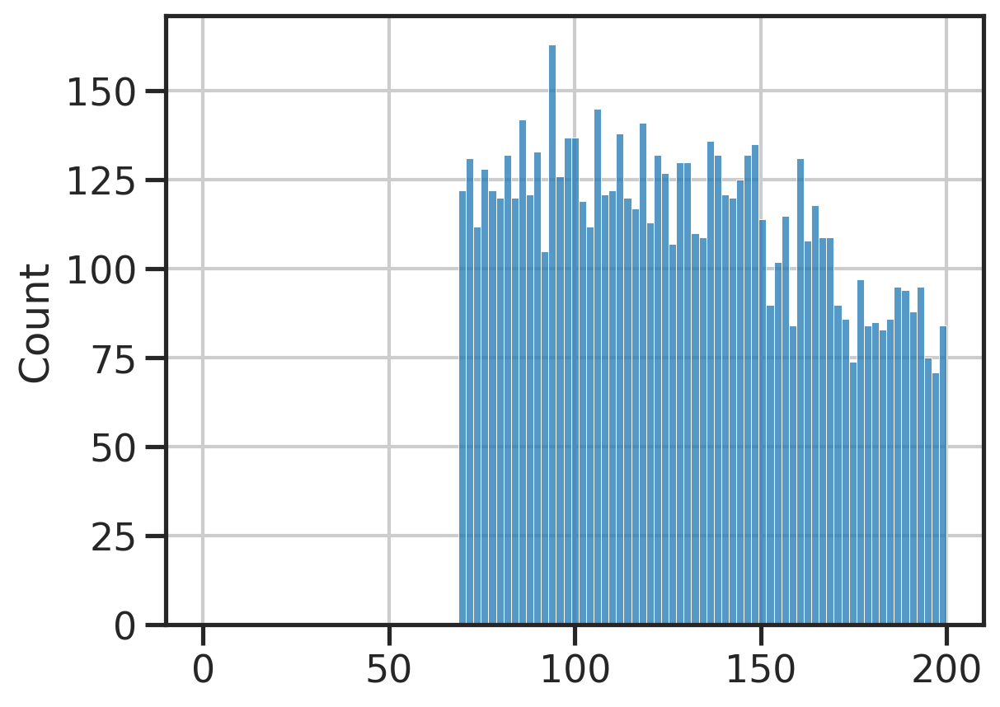

In [73]:
sns.histplot(adata.obs['jnorm_transcript_count'].values, bins=np.linspace(0,200,100))

<Axes: ylabel='Count'>

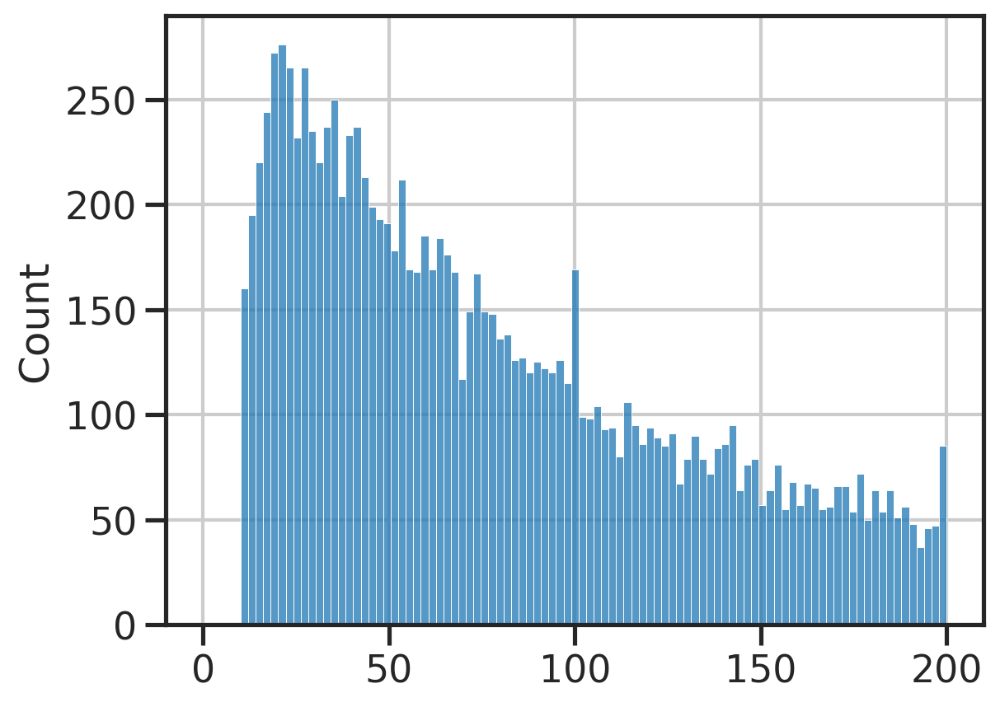

In [74]:
sns.histplot(adata.obs['transcript_count'].values, bins=np.linspace(0,200,100))

[Text(0, 0, 'P28DR_ant'),
 Text(1, 0, 'P28DR_pos'),
 Text(2, 0, 'P28DRb_ant'),
 Text(3, 0, 'P28DRb_pos'),
 Text(4, 0, 'P28NR_ant'),
 Text(5, 0, 'P28NR_pos'),
 Text(6, 0, 'P28NRb_ant'),
 Text(7, 0, 'P28NRb_pos')]

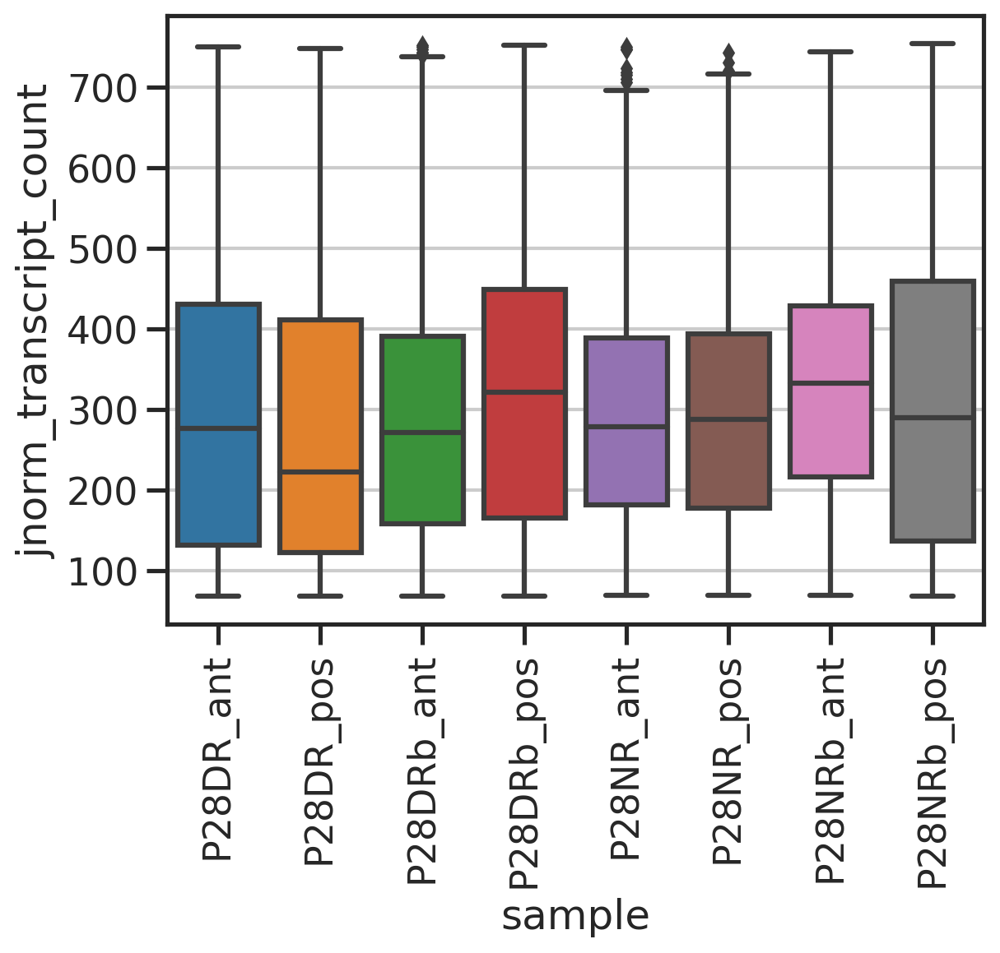

In [118]:
fig, ax = plt.subplots()
sns.boxplot(data=adata.obs, y='jnorm_transcript_count', x='sample', ax=ax) #].values
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

(0.0, 500.0)

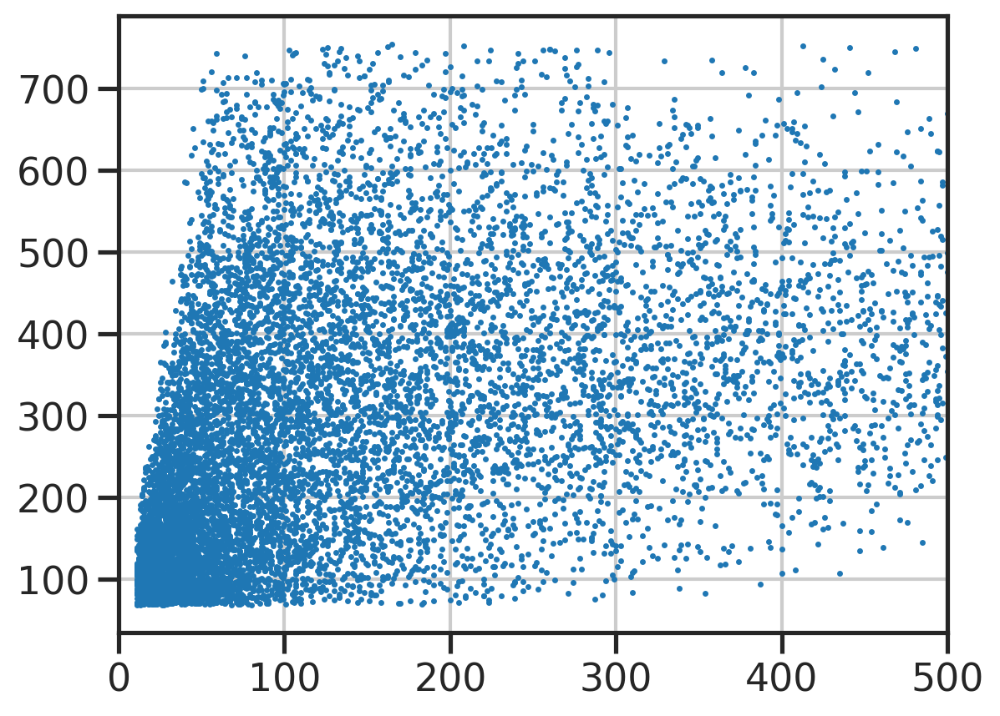

In [143]:
plt.scatter(
    # adata.obs['volume'].values,
    adata.obs['transcript_count'].values, 
    adata.obs['jnorm_transcript_count'].values, 
    s=1,
    )
plt.xlim([0,500])

In [144]:
adata = adata[adata.obs['annot'].str.contains('Glu')]
n0 = len(adata)
print(adata)
# adata = adata[adata.obs['jnorm_transcript_count']>100]
adata = adata[adata.obs['transcript_count']>50]
n1 = len(adata)
print(adata)
print((n1/n0)*100)


View of AnnData object with n_obs × n_vars = 11277 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23', 'sample', 'norm_transcript_count', 'jnorm_transcript_count', 'depth_show', 'width_show', 'leiden_r0.5', 'annot'
    uns: 'clst_annots', 'leiden', 'neighbors'
    obsm: 'blanks', 'pca', 'umap', 'pcs_typegenes'
    layers: 'jnorm', 'ljnorm', 'norm'
    obsp: 'connectivities', 'distances'
View of AnnData object with n_obs × n_vars = 8408 × 500
    obs: 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'depth', 'width', 'inside_v1l23'

In [145]:
from scipy import stats
mat = adata[:,abcgenes].layers['ljnorm']
mat = stats.zscore(mat, axis=0)

mat_nr = adata[adata.obs['sample'].str.contains('NR'), abcgenes].layers['ljnorm']
mat_nr = stats.zscore(mat_nr, axis=0)

pca = PCA(n_components=5)
# pcs_typegenes = pca.fit(mat_nr).transform(mat)
pcs_typegenes = pca.fit(mat).transform(mat)
adata.obsm['pcs_typegenes'] = pcs_typegenes

In [146]:
xi, yi = 0, 1
xsign, ysign = 1, 1

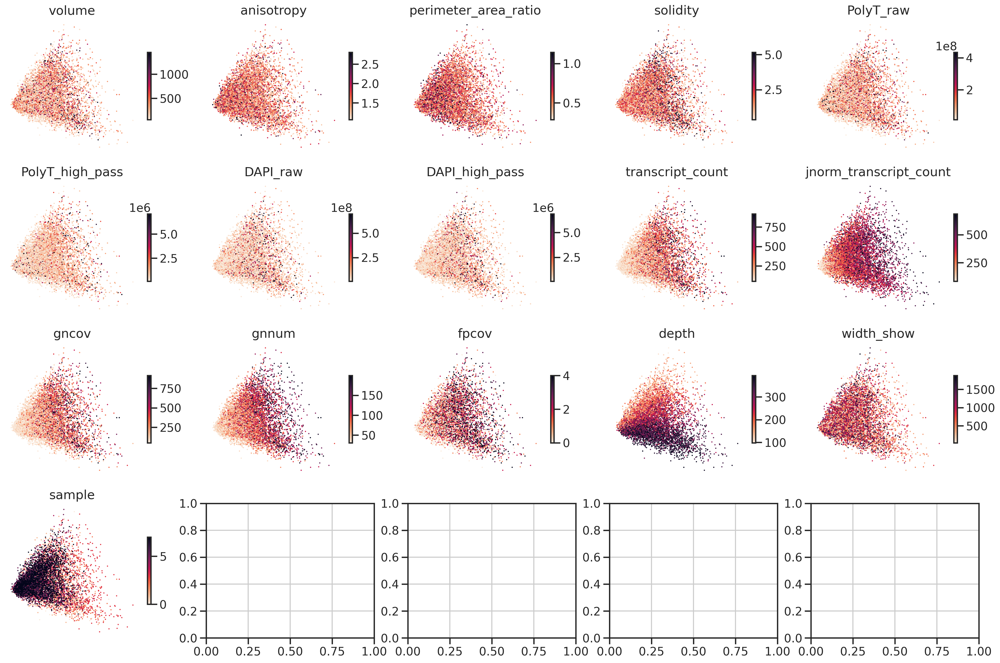

In [147]:
x = xsign*pcs_typegenes[:,xi]
y = ysign*pcs_typegenes[:,yi]
metrics = [
    'volume', 'anisotropy', 'perimeter_area_ratio', 'solidity', 
    'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 
    'transcript_count', 'jnorm_transcript_count', 'gncov', 'gnnum', 'fpcov', 
    'depth', 'width_show', 'sample' 
       ]

n = len(metrics)
nx = 5
ny = int((n+nx-1)/nx)
# add some quality metrics
fig, axs = plt.subplots(ny,nx,figsize=(nx*5,ny*4))
for metric, ax in zip(metrics, axs.flat):
    g = adata.obs[metric].values
    if metric == 'sample':
        g, uniq_lbls = pd.factorize(g)
    p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    fig.colorbar(p, shrink=0.5)
    ax.set_title(metric)
plt.show()


In [148]:
xi, yi = 1, 2
xsign, ysign = -1, -1

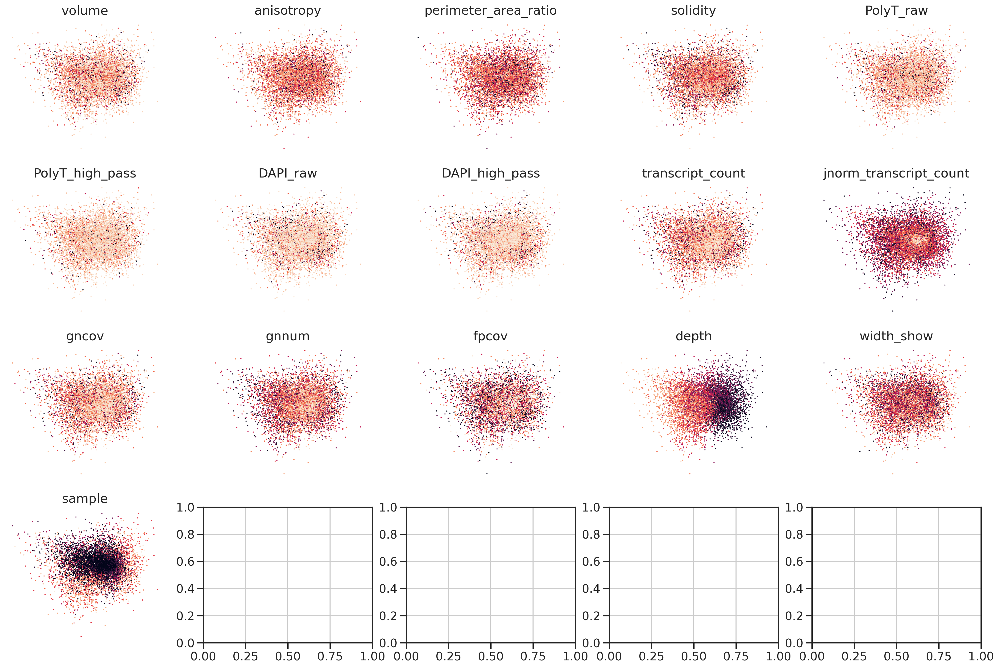

In [149]:
x = xsign*pcs_typegenes[:,xi]
y = ysign*pcs_typegenes[:,yi]


n = len(metrics)
nx = 5
ny = int((n+nx-1)/nx)
# add some quality metrics
fig, axs = plt.subplots(ny,nx,figsize=(nx*5,ny*4))
for metric, ax in zip(metrics, axs.flat):
    g = adata.obs[metric].values
    if metric == 'sample':
        g, uniq_lbls = pd.factorize(g)
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    ax.set_title(metric)
plt.show()


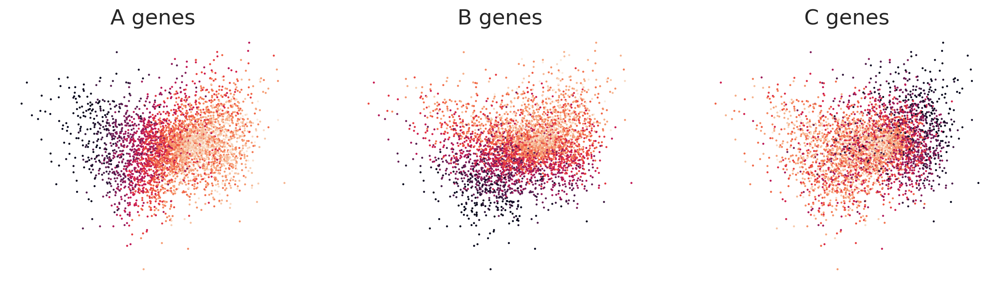

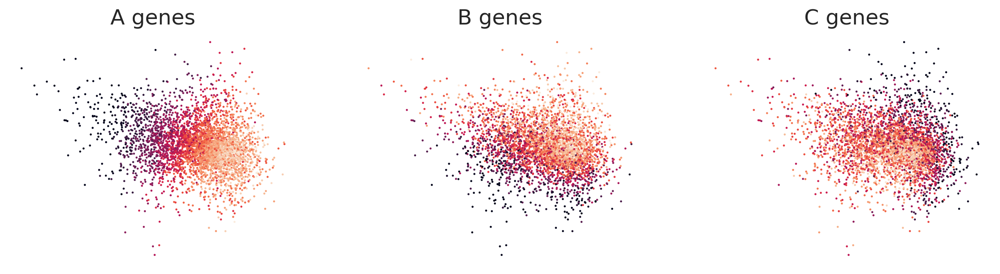

In [150]:
gns = [agenes, bgenes, cgenes]
titles = ['A genes', 'B genes', 'C genes']
adatasub = adata[adata.obs['sample'].str.contains('NR')]
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4), sharex=True, sharey=True)
for gn, title, ax in zip(gns, titles, axs):
    g = adatasub[:,gn].layers['ljnorm'].mean(axis=1)
    x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    ax.set_title(title)
    
adatasub = adata[adata.obs['sample'].str.contains('DR')]
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for gn, title, ax in zip(gns, titles, axs):
    g = adatasub[:,gn].layers['ljnorm'].mean(axis=1)
    x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    ax.set_title(title)
    

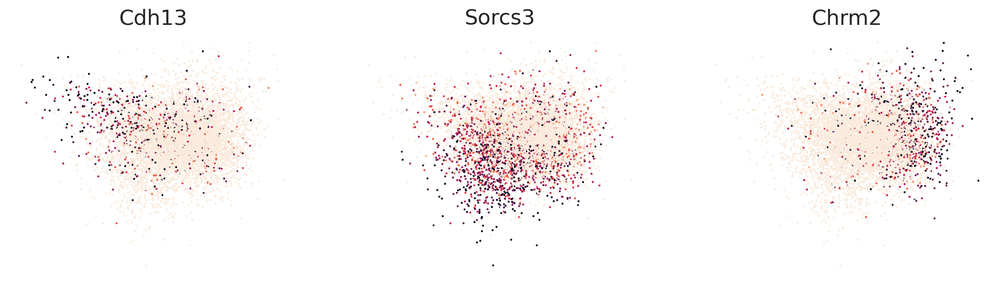

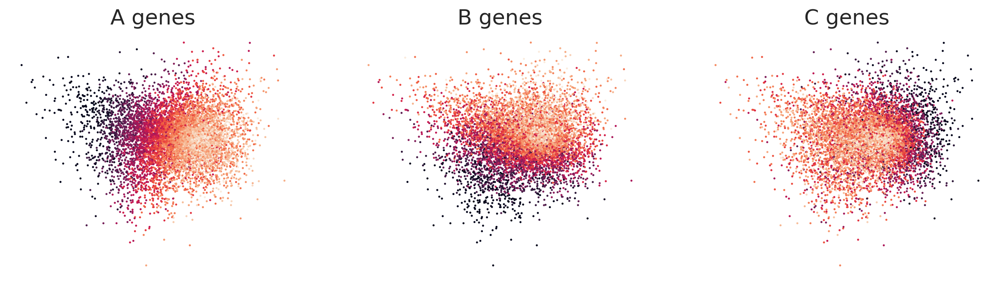

In [151]:
x = xsign*pcs_typegenes[:,xi]
y = ysign*pcs_typegenes[:,yi]
gns = ['Cdh13', 'Sorcs3', 'Chrm2']

fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for gn, ax in zip(gns, axs):
    g = adata[:,gn].layers['ljnorm'].reshape(-1,)
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    ax.set_title(gn)
    
gns = [agenes, bgenes, cgenes]
titles = ['A genes', 'B genes', 'C genes']
# adatasub = adata[adata.obs['sample'].str.contains('NR')]
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4), sharex=True, sharey=True)
for gn, title, ax in zip(gns, titles, axs):
    g =       adata[:,gn].layers['ljnorm'].mean(axis=1)
    x = xsign*adata.obsm['pcs_typegenes'][:,xi]
    y = ysign*adata.obsm['pcs_typegenes'][:,yi]
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    ax.set_title(title)

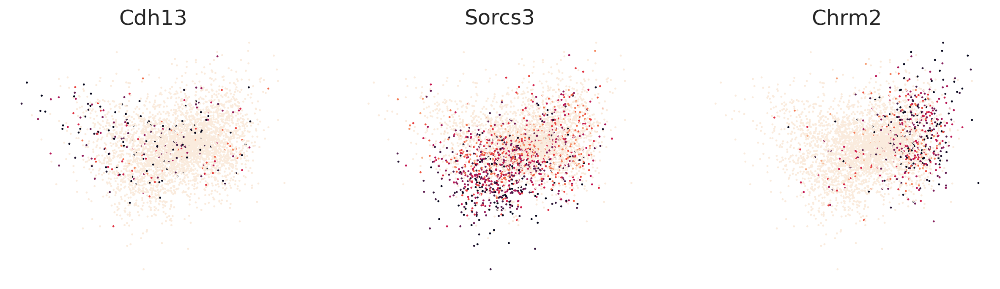

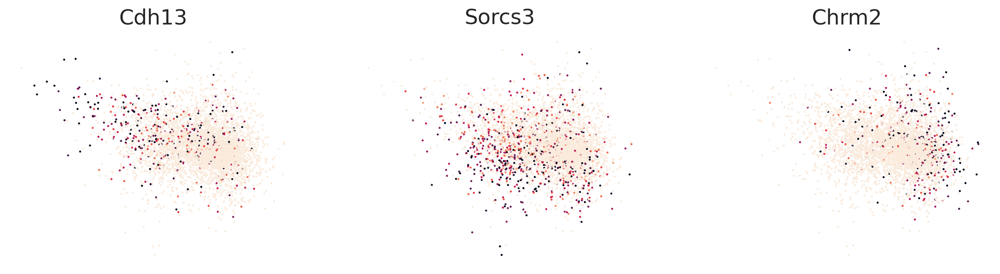

In [152]:
adatasub = adata[adata.obs['sample'].str.contains('NR')]
gns = ['Cdh13', 'Sorcs3', 'Chrm2']

fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for gn, ax in zip(gns, axs):
    g =       adatasub[:,gn].layers['ljnorm'].mean(axis=1)
    x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    ax.set_title(gn)
    
    
adatasub = adata[adata.obs['sample'].str.contains('DR')]
gns = ['Cdh13', 'Sorcs3', 'Chrm2']
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4))
for gn, ax in zip(gns, axs):
    g =       adatasub[:,gn].layers['ljnorm'].mean(axis=1)
    x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=3)
    ax.set_title(gn)
    

[-8. -7. -6. -5. -4. -3. -2. -1.  0.  1.  2.  3.  4.  5.  6.  7.  8.]
[-7. -6. -5. -4. -3. -2. -1.  0.  1.  2.  3.  4.  5.  6.  7.]
(16, 14)
(16, 14)


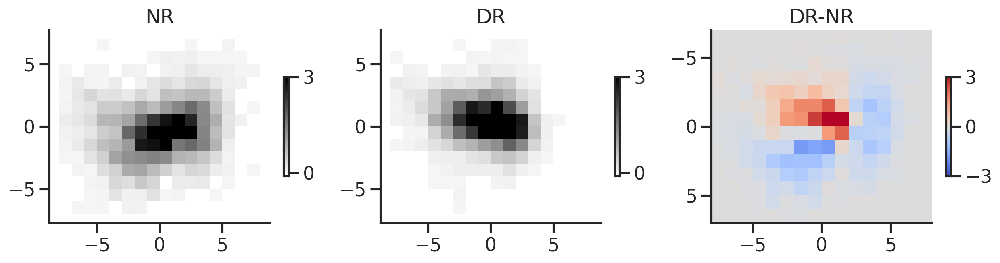

In [153]:
xmin, xmax = -8, 8
ymin, ymax = -7, 7 

bins_x = np.linspace(xmin, xmax, 1*(xmax-xmin)+1)
bins_y = np.linspace(ymin, ymax, 1*(ymax-ymin)+1)
print(bins_x)
print(bins_y)

hists = []
fig, axs = plt.subplots(1,3,figsize=(3*5,1*4), sharex=False, sharey=False)
for ax, cond in zip(axs, ['NR', 'DR']):
    adatasub = adata[adata.obs['sample'].str.contains(cond)]
    x =  xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y =  ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    sns.histplot(x=x, y=y, ax=ax, bins=(bins_x, bins_y), cmap='gray_r', stat='percent', vmin=-0.1, vmax=3, 
                 cbar=True, cbar_kws=dict(shrink=0.4, ticks=[0,3]))
    
    hist, _, _= np.histogram2d(x, y, bins=(bins_x, bins_y))
    hist = hist/len(x)*100
    hists.append(hist)
    print(hist.shape)
    ax.set_title(cond)
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.grid(False)
    
ax = axs[2] 
ax.set_title('DR-NR')
g = ax.imshow(pd.DataFrame(hists[1]-hists[0], 
                         index=bins_x[1:]-0.5, 
                         columns=bins_y[1:]-0.5).T, 
            extent=(xmin, xmax, ymin, ymax),
            cmap='coolwarm', vmax=3, vmin=-3)
ax.invert_yaxis()
ax.set_aspect('equal')
ax.grid(False)
fig.colorbar(g, shrink=0.4, ticks=[-3,0,3])
sns.despine(ax=ax)
plt.show()

(<Figure size 1600x600 with 3 Axes>,
 array([<Axes: title={'center': 'XY (spatial distribution)'}>,
        <Axes: title={'center': 'UMAP (molecular similarity)'}>],
       dtype=object))

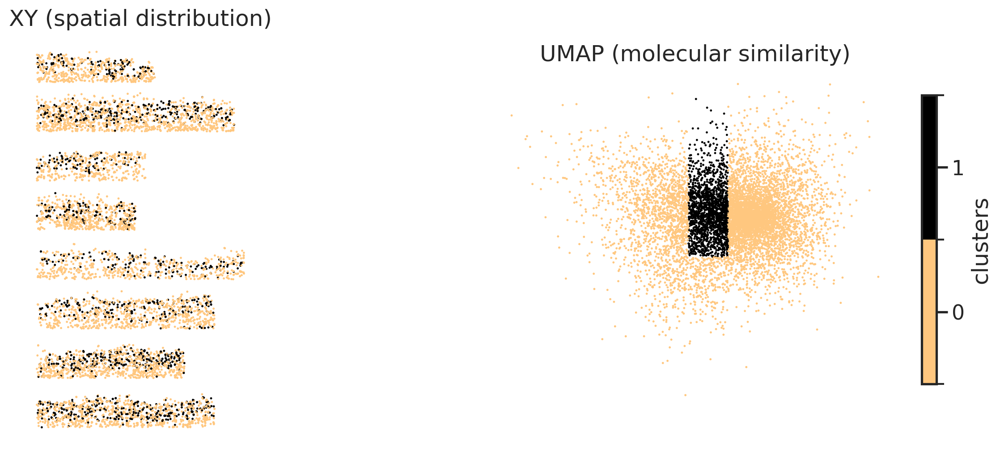

In [155]:
xr =  adata.obs['width_show']
yr =  adata.obs['depth_show']
ux = xsign*adata.obsm['pcs_typegenes'][:,xi]
uy = ysign*adata.obsm['pcs_typegenes'][:,yi]
# show = (adata.obs['gncov'] < 130)
show = (ux < -2)
show = ux > 2
# show = uy < -2
# show = ux < -2
# show = np.all([ux < 2, ux > -3, uy < -2], axis=0)
show = np.all([ux < 0, ux >-2, uy > -2], axis=0)
# show = ux < 0
# show = adata.obs['gncov'] < 120
utils_merfish.plot_cluster(show, xr, yr, ux, uy, s=3, cmap=plt.cm.copper_r)

# visualize FISH

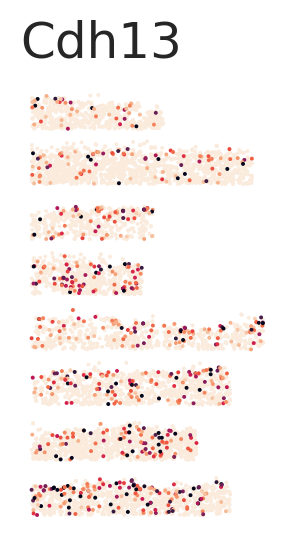

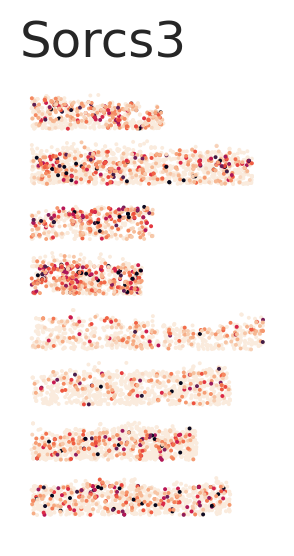

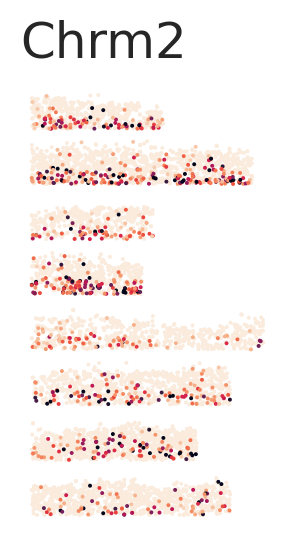

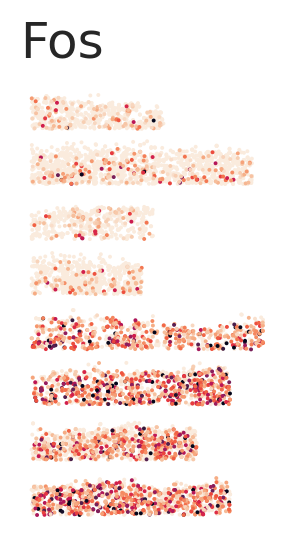

In [156]:
# check
gns = ['Cdh13', 'Sorcs3', 'Chrm2', 'Fos']
x =  adata.obs['width_show']
y =  adata.obs['depth_show']
n = len(gns)

for gn in gns:
    fig, ax = plt.subplots(1,1,figsize=(1*10,1*3))
    g = adata[:,gn].layers['jnorm'].reshape(-1,)
    
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    cond = g > 1e-5
    
    utils_merfish.st_scatter_ax(fig, ax, x[~cond], y[~cond], gexp=g[~cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    utils_merfish.st_scatter_ax(fig, ax,  x[cond],  y[cond],  gexp=g[cond], s=2, title='', vmin=vmin, vmax=vmax, cmap='rocket_r') #, axis_off=False)
    ax.set_title(gn, loc='left')
    
    # ax.grid(True)
    # ax.axis('on')
    
plt.show()

# stats

In [157]:
stats = {}
for name in names:
    adatasub = adata[adata.obs['sample']==name]# v1l23_data[name]
    lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb = binning_pipe(adatasub, layer='ljnorm', bin_type='depth_bin', n=12)
    stats[name] = (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb)
d.value_counts()

(65.356, 95.762]       14
(95.762, 126.168]      34
(126.168, 156.574]    123
(156.574, 186.981]    135
(186.981, 217.387]    153
(217.387, 247.793]    148
(247.793, 278.199]    144
(278.199, 308.605]    164
(308.605, 339.012]    141
(339.012, 369.418]    135
(369.418, 399.824]    122
dtype: int64

In [158]:
# mean expression level across V1 L2/3 in NR
base_a0 = []
base_b0 = []
base_c0 = []
base_i0 = []
for name in ['P28NR_ant', 'P28NR_pos', 'P28NRb_ant', 'P28NRb_pos']:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb) = stats[name]
    base_a = np.mean(lnorm_mean.iloc[:,agenes_idx], axis=0) # across depth bins for each gene
    base_b = np.mean(lnorm_mean.iloc[:,bgenes_idx], axis=0) # across depth bins for each gene
    base_c = np.mean(lnorm_mean.iloc[:,cgenes_idx], axis=0) # across depth bins for each gene
    base_i = np.mean(lnorm_mean.iloc[:,igenes_idx], axis=0) # across depth bins for each gene
    
    base_a0.append(base_a)
    base_b0.append(base_b)
    base_c0.append(base_c)
    base_i0.append(base_i)
    
base_a0 = np.mean(base_a0, axis=0)
base_b0 = np.mean(base_b0, axis=0)
base_c0 = np.mean(base_c0, axis=0)
base_i0 = np.mean(base_i0, axis=0)

base_a0.shape, base_b0.shape, base_c0.shape, base_i0.shape

((64,), (35,), (71,), (22,))

In [159]:
means = {}
sems = {}
for name in names:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb) = stats[name]
    
    amean = np.mean(lnorm_mean.iloc[:,agenes_idx]-base_a0, axis=1) # a bin vector
    bmean = np.mean(lnorm_mean.iloc[:,bgenes_idx]-base_b0, axis=1) # a bin vector
    cmean = np.mean(lnorm_mean.iloc[:,cgenes_idx]-base_c0, axis=1) # a bin vector
    imean = np.mean(lnorm_mean.iloc[:,igenes_idx]-base_i0, axis=1) # a bin vector
    
    asem = np.mean(lnorm_sem.iloc[:,agenes_idx], axis=1)
    bsem = np.mean(lnorm_sem.iloc[:,bgenes_idx], axis=1)
    csem = np.mean(lnorm_sem.iloc[:,cgenes_idx], axis=1)
    isem = np.mean(lnorm_sem.iloc[:,igenes_idx], axis=1)
    
    means[name] = [amean, bmean, cmean, imean]
    sems[name] = [asem, bsem, csem, isem]
    

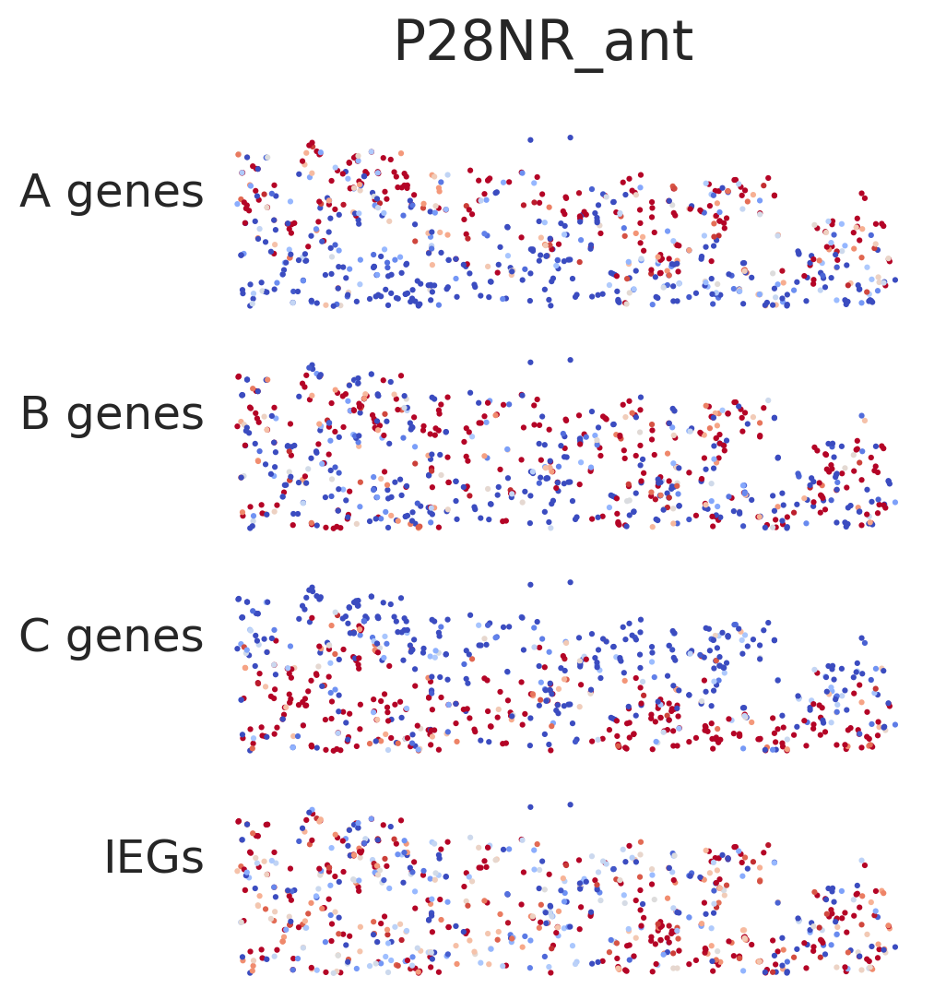

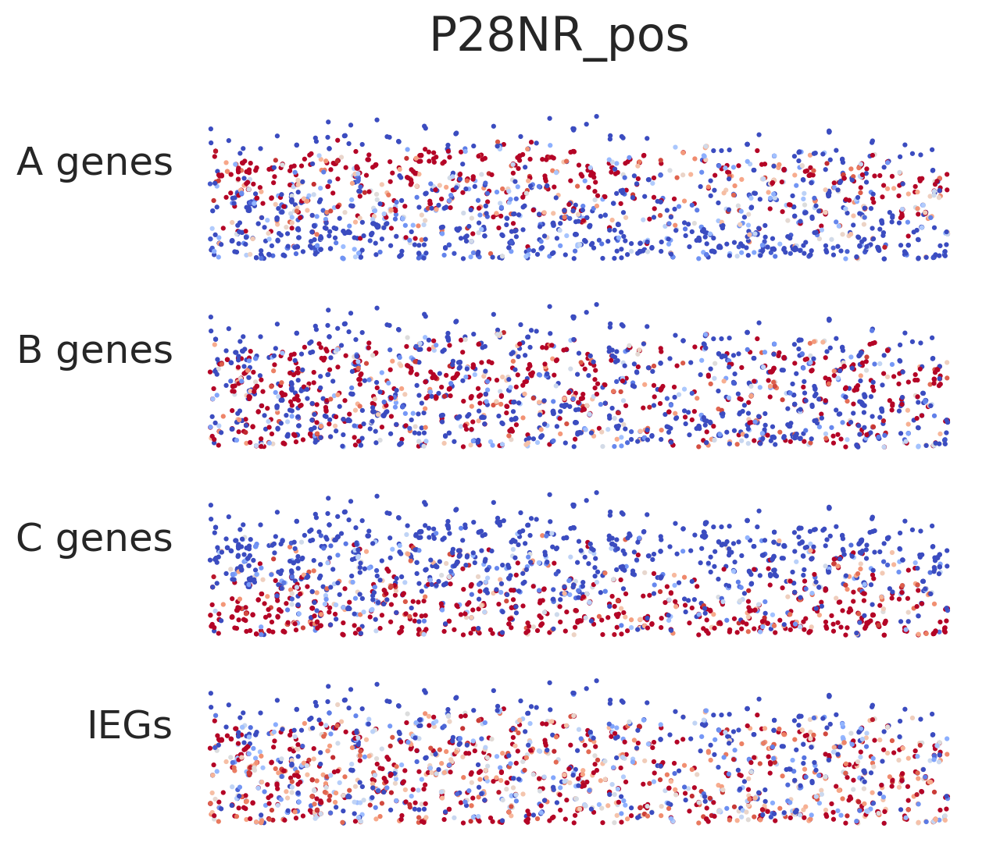

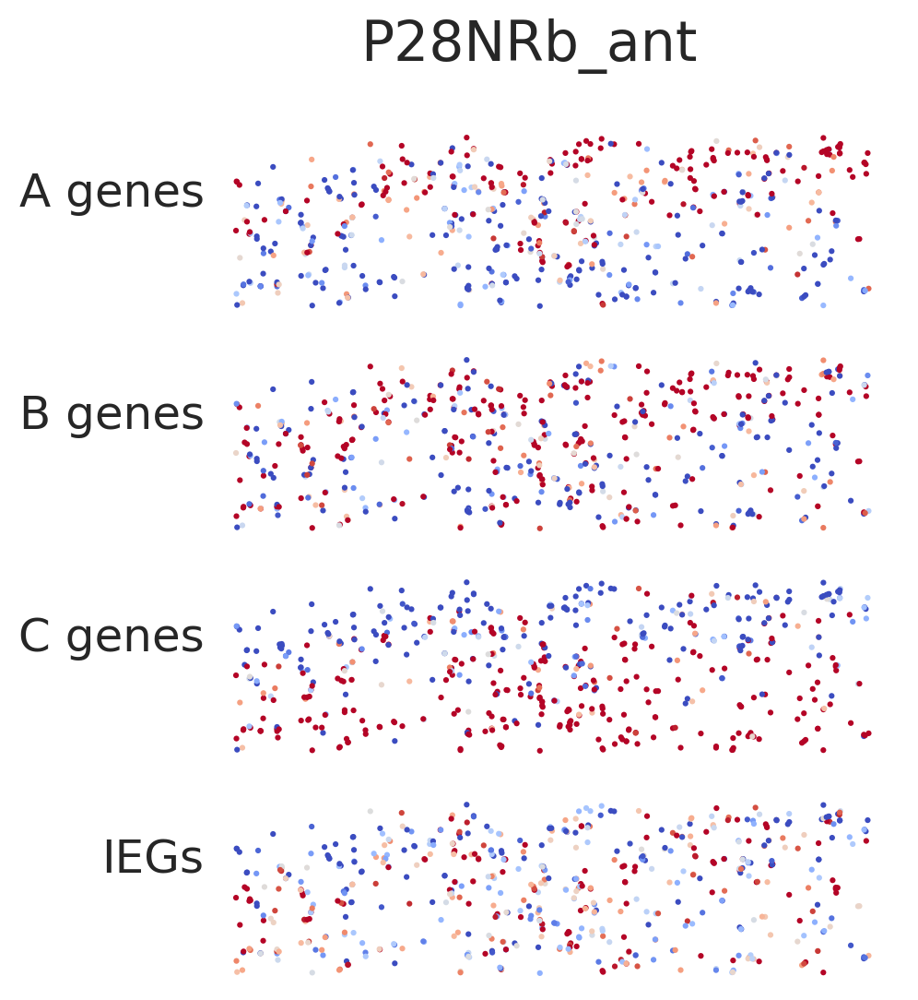

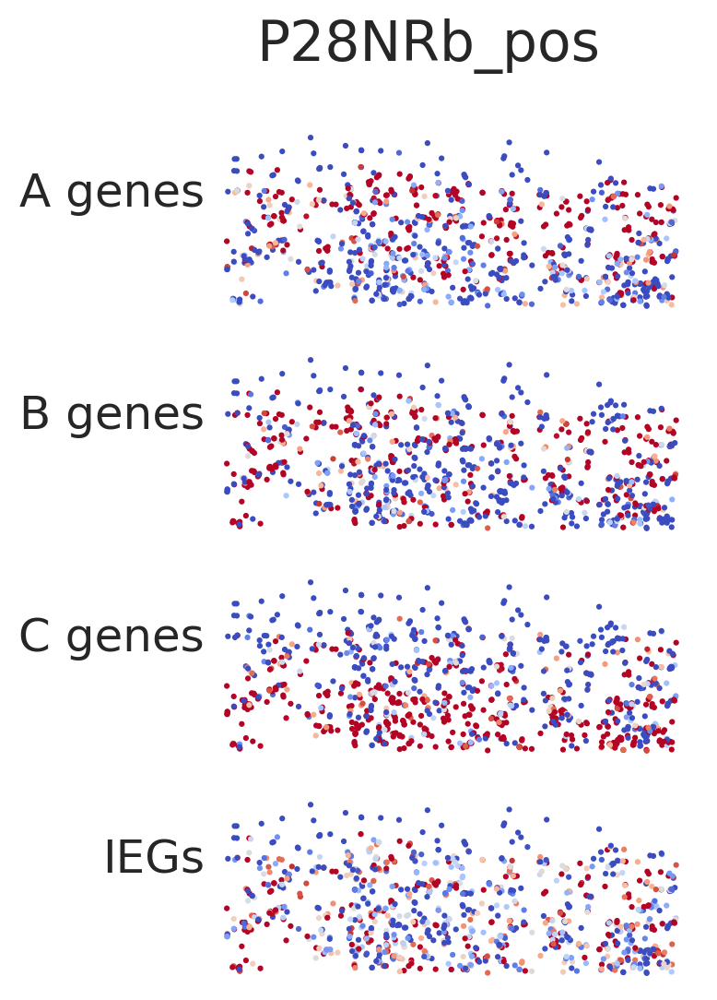

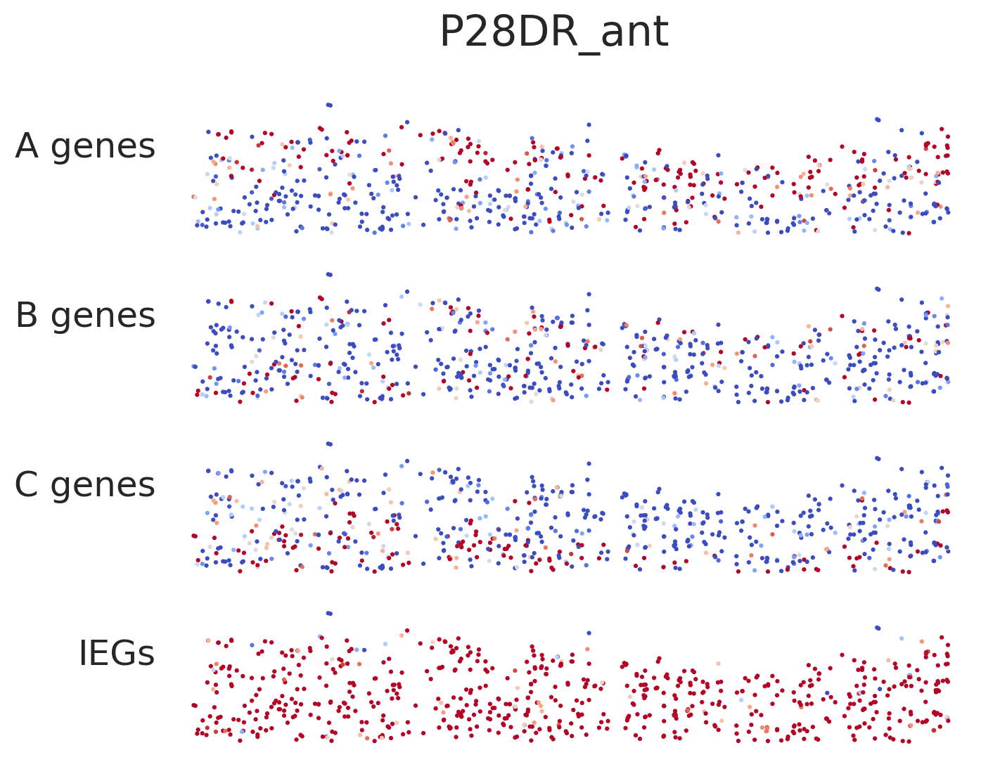

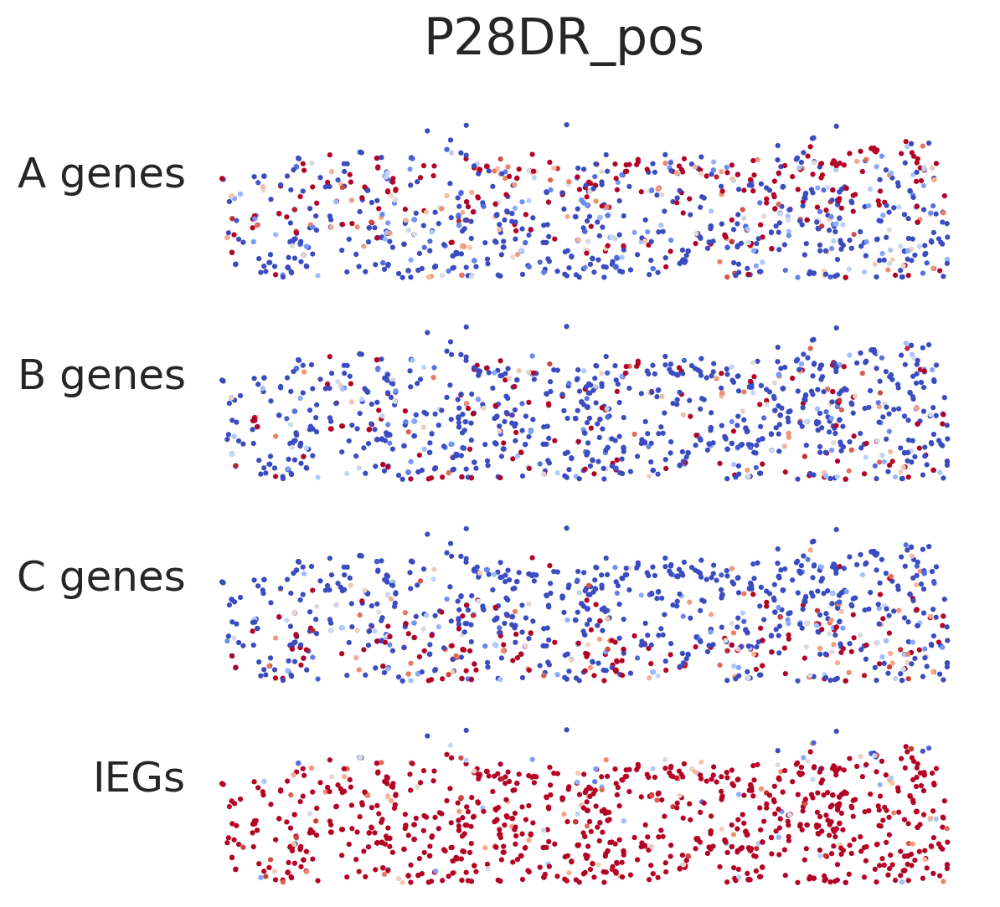

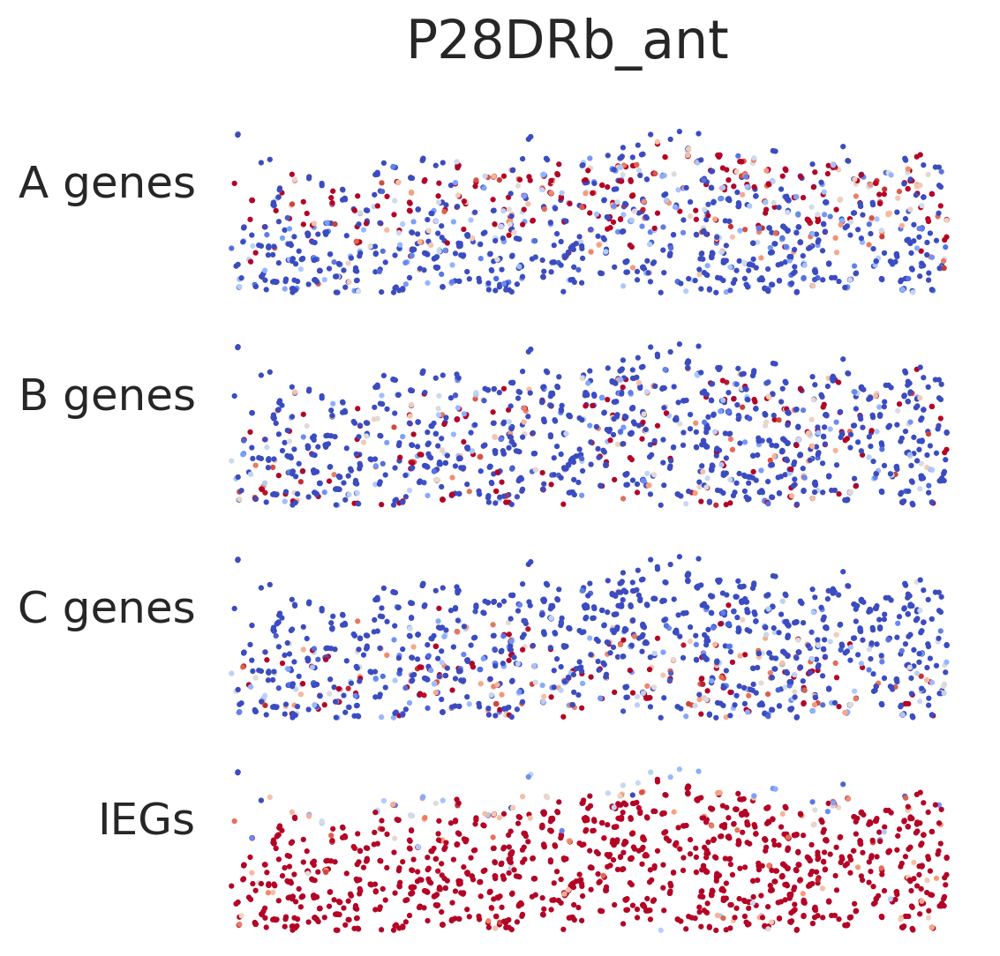

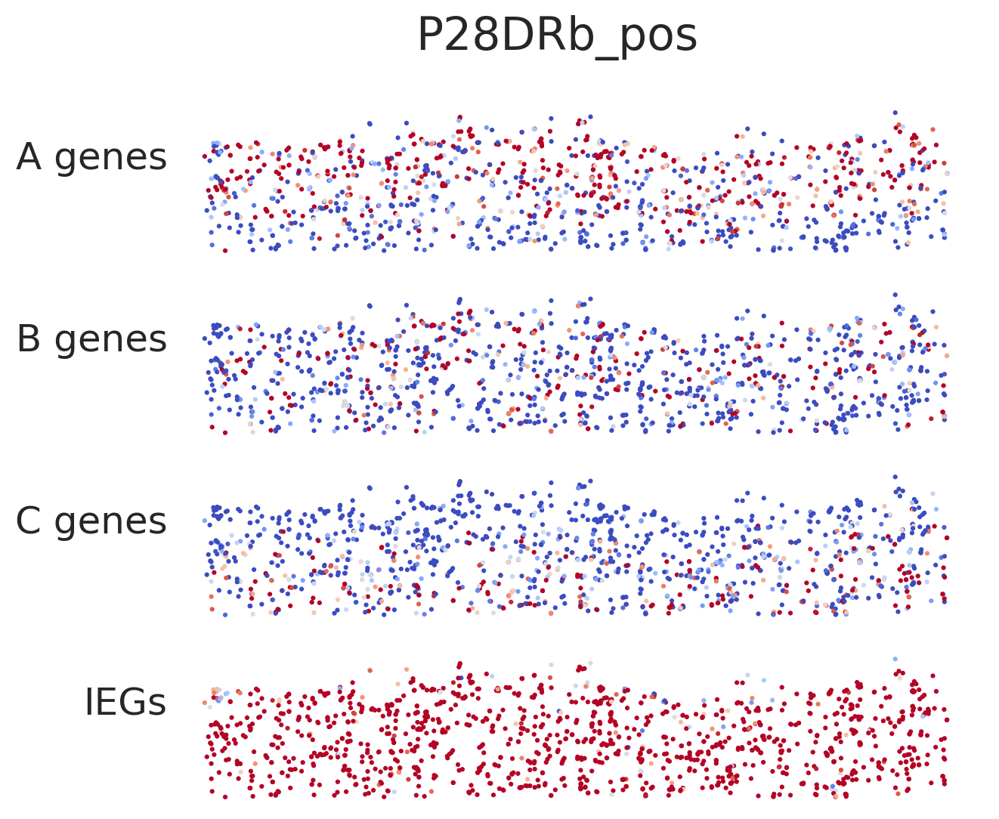

In [160]:
for name in names:
    adatasub = adata[adata.obs['sample']==name]# v1l23_data[name]
    
    depth = adatasub.obs['depth'].values
    width = adatasub.obs['width'].values
    mat   = adatasub.layers['ljnorm']

    fig, axs = plt.subplots(4,1,figsize=(10,4*1.5))
    fig.suptitle(name)
    gnames = ['A genes', 'B genes', 'C genes', 'IEGs']
    for i, (_idx, _baseline) in enumerate(zip([agenes_idx, bgenes_idx, cgenes_idx, igenes_idx], 
                                              [base_a0, base_b0, base_c0, base_i0])):
        ax = axs[i]
        lnorm_ = mat[:,_idx].copy()
        g = (lnorm_ - np.array(_baseline).reshape(1,-1)).mean(axis=1) 
        gn = gnames[i]
        if i < 3:
            vmax = +0.08 # np.percentile(g, 95)
            vmin = -0.08 # np.percentile(g,  0)
        else:
            vmax = +0.25 # np.percentile(g, 95)
            vmin = -0.25 # np.percentile(g,  0)

        utils_merfish.st_scatter_ax(fig, ax, width, -depth, gexp=g, s=5, title='', vmin=vmin, vmax=vmax, cmap='coolwarm') #, axis_off=False)
        ax.set_title(gn, loc='left', ha='right', y=0.5)
    plt.show()

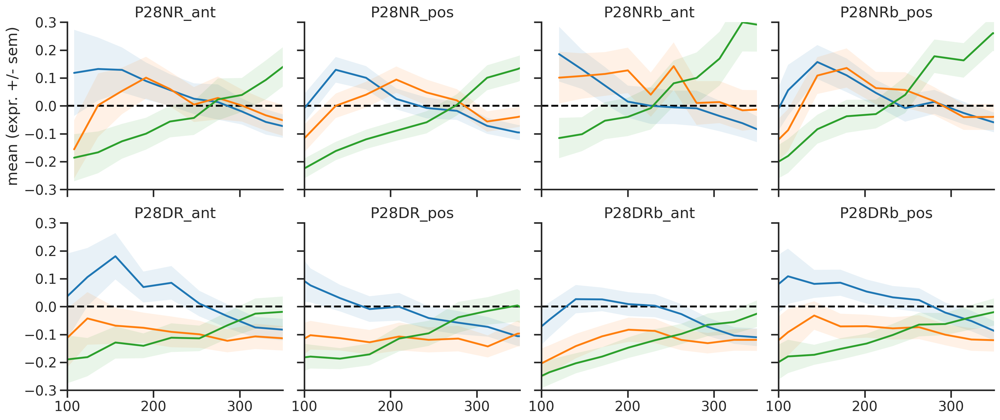

In [161]:
gnames = ['A genes (n=64)', 'B genes (n=35)', 'C genes (n=71)']

fig, axs = plt.subplots(2, 4, figsize=(5*4,4*2), sharex=True, sharey=True)

# ax.set_title('P28NR')
linestyle = '-'
for ax, name in zip(axs.flat, [
    'P28NR_ant', 'P28NR_pos', 
    'P28NRb_ant', 'P28NRb_pos', 
    
    'P28DR_ant', 'P28DR_pos',
    'P28DRb_ant', 'P28DRb_pos',
    ]):
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb) = stats[name]
    amean, bmean, cmean, imean = means[name]
    asem, bsem, csem, isem = sems[name]
    
    x = np.mean(np.vstack([db[:-1], db[1:]]), axis=0)
    
    ax.plot(x, amean, label='A genes', color='C0', linestyle=linestyle)
    ax.fill_between(x, amean-asem, amean+asem, color='C0', alpha=0.1, edgecolor='none')
    ax.plot(x, bmean, label='B genes', color='C1', linestyle=linestyle)
    ax.fill_between(x, bmean-bsem, bmean+bsem, color='C1', alpha=0.1, edgecolor='none')
    ax.plot(x, cmean, label='C genes', color='C2', linestyle=linestyle)
    ax.fill_between(x, cmean-csem, cmean+csem, color='C2', alpha=0.1, edgecolor='none')
    ax.axhline(color='k', linestyle='--', zorder=1)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(name)
axs.flat[0].set_ylabel('mean (expr. +/- sem)')

    
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')

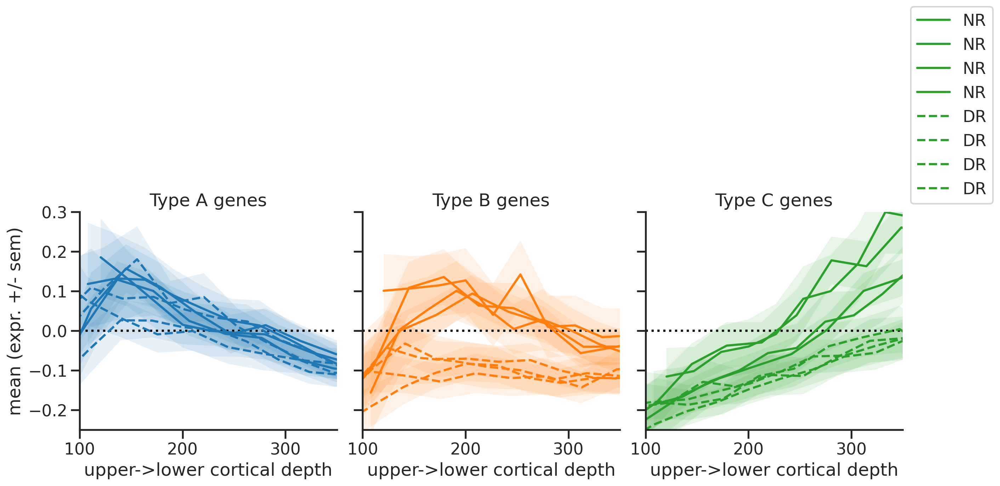

In [162]:
gnames = ['Type A genes', 'Type B genes', 'Type C genes']

fig, axs = plt.subplots(1, 3, figsize=(5*3,4), sharex=True, sharey=True)

for i in range(3):
    ax = axs[i]
    sns.despine(ax=ax)
    ax.set_title(gnames[i])
    ax.grid(False)
    color = f'C{i}'
    
    for name in ['P28NR_ant', 'P28NR_pos', 'P28NRb_ant', 'P28NRb_pos']:
        (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb) = stats[name]
        mean_vec = means[name][i]
        sem_vec = sems[name][i]

        x = np.mean(np.vstack([db[:-1], db[1:]]), axis=0)
        ax.plot(x, mean_vec, label='NR', color=color, linestyle='-')
        ax.fill_between(x, mean_vec-sem_vec, mean_vec+sem_vec, color=color, alpha=0.1, edgecolor='none')
    
    for name in ['P28DR_ant', 'P28DR_pos', 'P28DRb_ant', 'P28DRb_pos']:
        (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb) = stats[name]
        mean_vec = means[name][i]
        sem_vec = sems[name][i]

        x = np.mean(np.vstack([db[:-1], db[1:]]), axis=0)
        ax.plot(x, mean_vec, label='DR', color=color, linestyle='--')
        ax.fill_between(x, mean_vec-sem_vec, mean_vec+sem_vec, color=color, alpha=0.1, edgecolor='none')
        
    ax.set_ylim([-0.25, 0.3])
    ax.axhline(color='k', linestyle='dotted', zorder=1)
    ax.set_xticks([100, 200, 300])
    ax.set_xlim(left=100, right=350)
    ax.set_xlabel('upper->lower cortical depth')
    
axs[0].set_ylabel('mean (expr. +/- sem)')
axs[2].legend(bbox_to_anchor=(1,1))

fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')

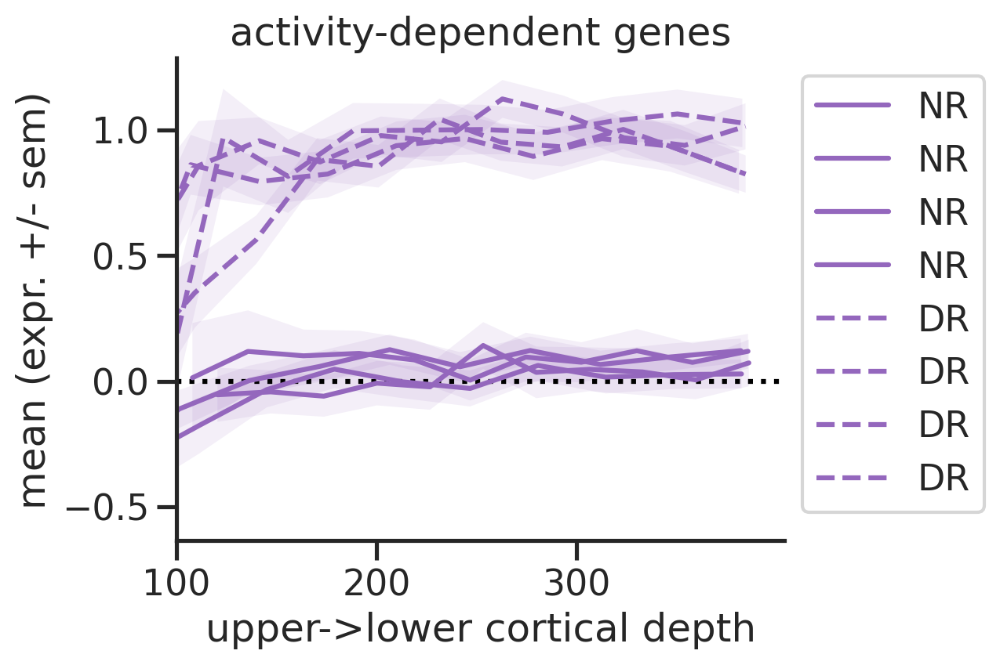

In [163]:
gnames = ['activity-dependent genes',]

fig, ax = plt.subplots(1, 1, figsize=(5*1,4))

i = 3
color = f'C4'

sns.despine(ax=ax)
ax.set_title(gnames[0])
ax.grid(False)

for name in ['P28NR_ant', 'P28NR_pos', 'P28NRb_ant', 'P28NRb_pos']:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb) = stats[name]
    mean_vec = means[name][i]
    sem_vec = sems[name][i]

    x = np.mean(np.vstack([db[:-1], db[1:]]), axis=0)
    ax.plot(x, mean_vec, label='NR', color=color, linestyle='-')
    ax.fill_between(x, mean_vec-sem_vec, mean_vec+sem_vec, color=color, alpha=0.1, edgecolor='none')

for name in ['P28DR_ant', 'P28DR_pos', 'P28DRb_ant', 'P28DRb_pos']:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, w, db, wb) = stats[name]
    mean_vec = means[name][i]
    sem_vec = sems[name][i]

    x = np.mean(np.vstack([db[:-1], db[1:]]), axis=0)
    ax.plot(x, mean_vec, label='DR', color=color, linestyle='--')
    ax.fill_between(x, mean_vec-sem_vec, mean_vec+sem_vec, color=color, alpha=0.1, edgecolor='none')

# ax.set_ylim([-0.08, 0.08])
ax.axhline(color='k', linestyle='dotted', zorder=1)
# ax.set_xticks([0, 100, 200, 300])
ax.set_xticks([100, 200, 300])
ax.set_xlim(left=100)
ax.set_xlabel('upper->lower cortical depth')
    
ax.set_ylabel('mean (expr. +/- sem)')
ax.legend(bbox_to_anchor=(1,1))

fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')